In [2]:
import pandas as pd
import sys

# Sadata.obs에서 'sample' 열을 기준으로 고유한 sample들을 확인
samples = Sadata.obs['sample'].unique()

# sample별로 데이터를 분리하여 서로 다른 객체에 저장
for sample in samples:
    # sample에 해당하는 데이터를 필터링
    sample_data = Sadata[Sadata.obs['sample'] == sample]
    
    # sample명으로 객체 이름 지정 (예: "sample_1", "sample_2" 등)
    globals()["Sadata_"f"{sample}"] = sample_data
# 카테고리 값을 리스트로 변환하여 출력
print(samples.tolist())


['6800STDY12499406', '6800STDY12499409', '6800STDY12499411', '6800STDY12499502', '6800STDY12499503', '6800STDY12499504', '6800STDY12499505', '6800STDY12499506', '6800STDY12499507', '6800STDY12499508', '6800STDY12499509']


In [3]:
# 필수 열 리스트
required_columns = ['feature_types', 'genome', 'SYMBOL', 'mt']

# 객체 리스트 (globals()를 통해 객체명을 직접 가져오기)
objects = [
    Sadata_6800STDY12499406, Sadata_6800STDY12499409, Sadata_6800STDY12499411,
    Sadata_6800STDY12499502, Sadata_6800STDY12499503, Sadata_6800STDY12499504,
    Sadata_6800STDY12499505, Sadata_6800STDY12499506, Sadata_6800STDY12499507,
    Sadata_6800STDY12499508, Sadata_6800STDY12499509
]

# for문을 돌며 각 객체 처리
for obj in objects:
    # 객체명에서 'Sadata_'를 제외한 이름 추출
    sample_name = [name for name, value in globals().items() if value is obj][0].replace("Sadata_", "")
    
    # A 객체 초기화
    A = []
    
    # A 리스트에 sample_name을 추가
    A.append(sample_name)
    
    # 필수 열을 먼저 유지
    vars_to_keep = required_columns[:]
    
    # 샘플 이름에 해당하는 열만 포함하고 나머지 열은 삭제
    for col in obj.var.columns:
        if any(sample_name in col for sample_name in A):  # sample_name이 열 이름에 포함되어 있다면
            vars_to_keep.append(col)
    
    # obj.var에서 vars_to_keep에 없는 열 삭제
    vars_to_remove = [col for col in obj.var.columns if col not in vars_to_keep]
    
    # 해당 열들 삭제
    obj.var.drop(columns=vars_to_remove, inplace=True)
    
    # 변경된 객체 그대로 저장 (원본 객체가 갱신됨)
    globals()[f"Sadata_{sample_name}"] = obj

In [5]:
import os

# 객체 리스트 (globals()에서 객체명을 정확하게 찾기)
objects = [
Sadata_6800STDY12499406, Sadata_6800STDY12499409, Sadata_6800STDY12499411, 
Sadata_6800STDY12499502, Sadata_6800STDY12499503, Sadata_6800STDY12499504, 
Sadata_6800STDY12499505, Sadata_6800STDY12499506, Sadata_6800STDY12499507, 
Sadata_6800STDY12499508, Sadata_6800STDY12499509
]

# 저장할 디렉토리 경로
save_dir = "/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/"

# 객체별로 h5ad 파일로 저장
for obj in objects:
    # 객체명에서 'Sadata_'를 제외한 이름 추출
    sample_name = [name for name, value in globals().items() if value is obj and name.startswith("Sadata_")][0].replace("Sadata_", "")
    
    # 저장할 파일 경로 설정
    save_path = os.path.join(save_dir, f"Sadata_{sample_name}.h5ad")
    
    # 객체를 h5ad 형식으로 저장
    obj.write(save_path)
    
    print(f"Saved {save_path}")


Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499406.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499409.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499411.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499502.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499503.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499504.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499505.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499506.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499507.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499508.h5ad
Saved /home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499509.h5ad


In [354]:
adata = Sadata_6800STDY12499411
text = 'Sadata_6800STDY12499411'
search_text = [text.replace("Sadata_", "")][0]
#6800STDY12499407
spatial_keys = [key for key in adata.uns['spatial'].keys() if search_text in key]

# 해당 키들을 정렬 (기본적으로 문자열 정렬)d
sorted_spatial_keys = sorted(spatial_keys)[0]

# 정렬된 키 출력
print(sorted_spatial_keys)

spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A


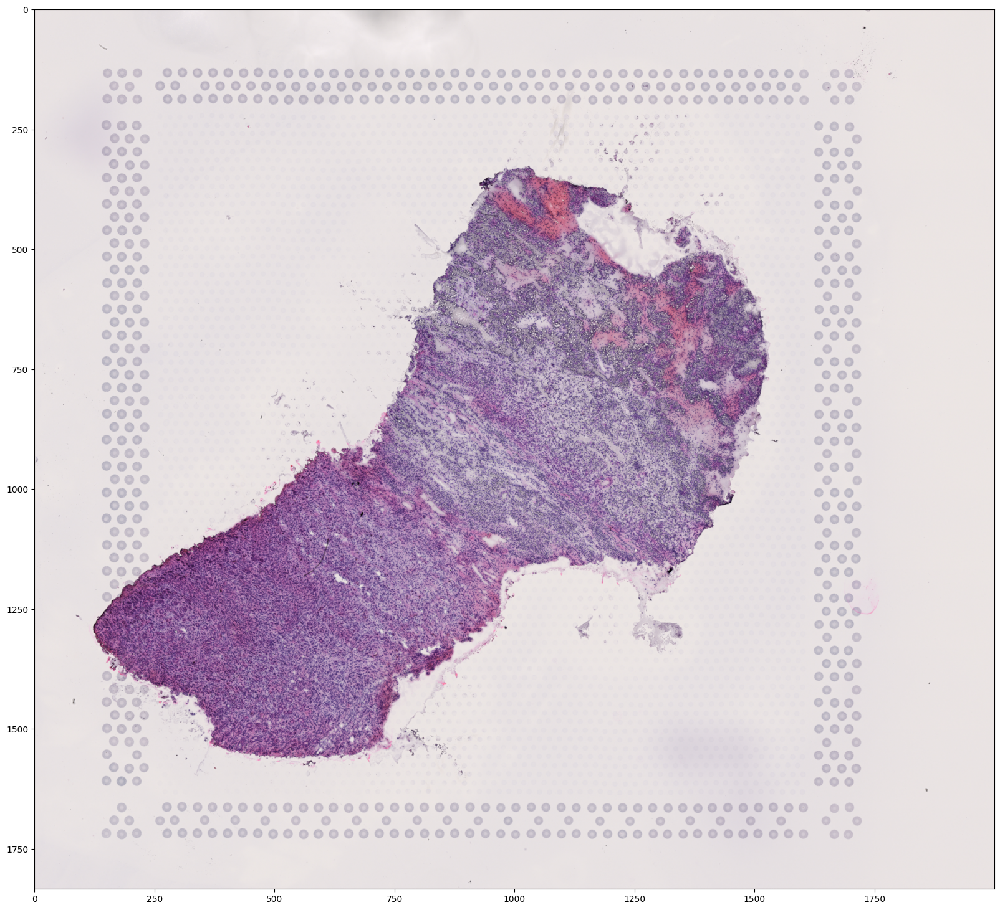

In [355]:
hires_image = adata.uns['spatial'][sorted_spatial_keys]['images']['hires']
scalefactors = adata.uns['spatial'][sorted_spatial_keys]['scalefactors']
            
# 해당 라이브러리에 맞는 hires_scalefactor 가져오기
hires_scalefactor = scalefactors['tissue_hires_scalef']

# 좌표 스케일 조정 (hires 이미지에 맞춤)
spatial_coords = adata.obsm['spatial']* hires_scalefactor

# 이미지의 크기 가져오기
img_height, img_width, _ = hires_image.shape

# 이미지 크기에 맞춰 figure 크기 설정
plt.figure(figsize=(img_width / 100, img_height / 100))  # DPI 조정
plt.imshow(hires_image)

In [76]:
import pandas as pd
import scanpy as sc
from anndata import read_h5ad
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Sadata_6800STDY12499411.h5ad')
adata.var = adata.var.loc[~adata.var.index.duplicated(keep='first')]
adata.var['ENSEMBLE'] = adata.var.index
adata.var.index = adata.var['SYMBOL']
adata.var.rename(columns={'ENSEMBLE': 'ENSEMBLE_ID'}, inplace=True)
var_duplicates = adata.var.index[adata.var.index.duplicated()].unique()
adata.var_names = adata.var_names.astype(str)

# 중복 유전자 제거 후 데이터 유지
adata = adata[:, ~adata.var.index.duplicated()].copy()
adata.var_names = adata.var_names.astype(str)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

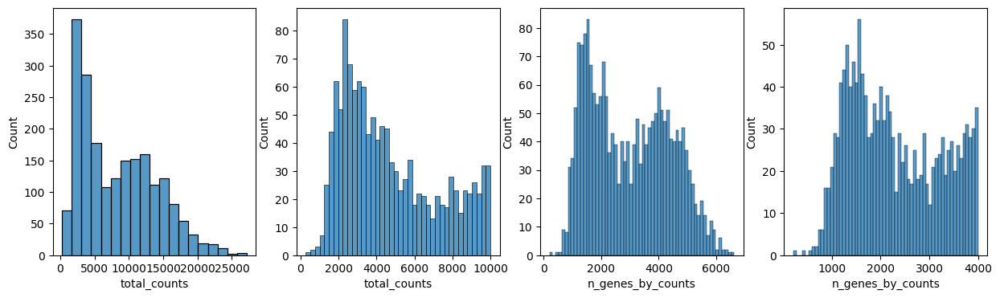

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns

adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [78]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
# sc.pp.filter_genes(adata, min_cells=10)
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

#cells after MT filter: 1251


In [79]:
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

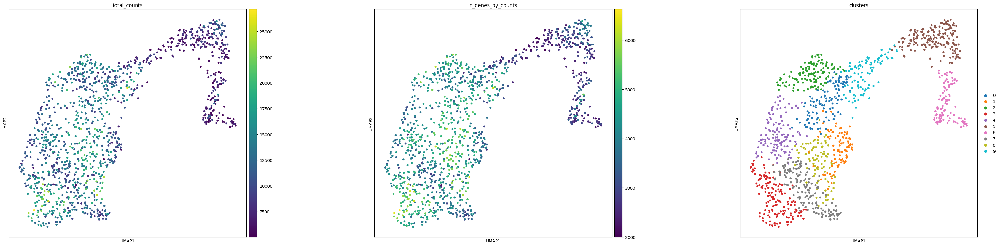

In [80]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2
)
plt.rcParams["figure.figsize"] = (10, 10)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

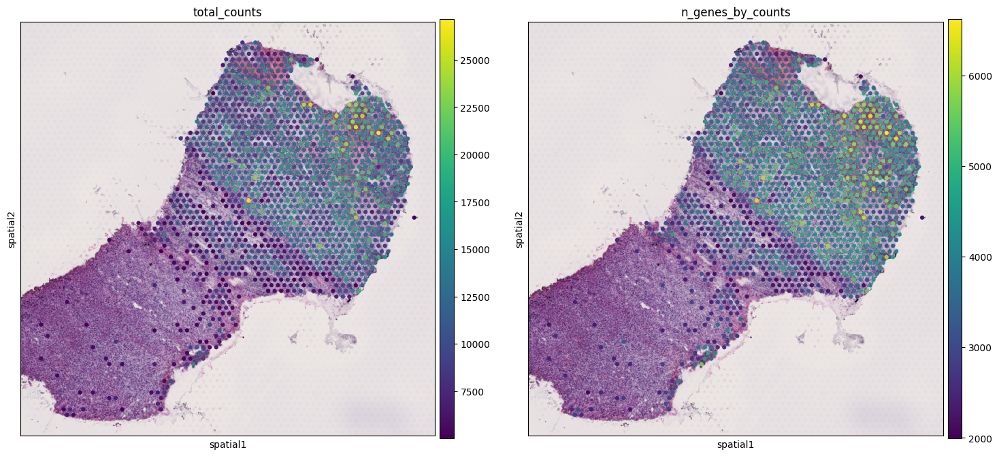

In [81]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", library_id = 'spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A'  ,color=["total_counts", "n_genes_by_counts"])

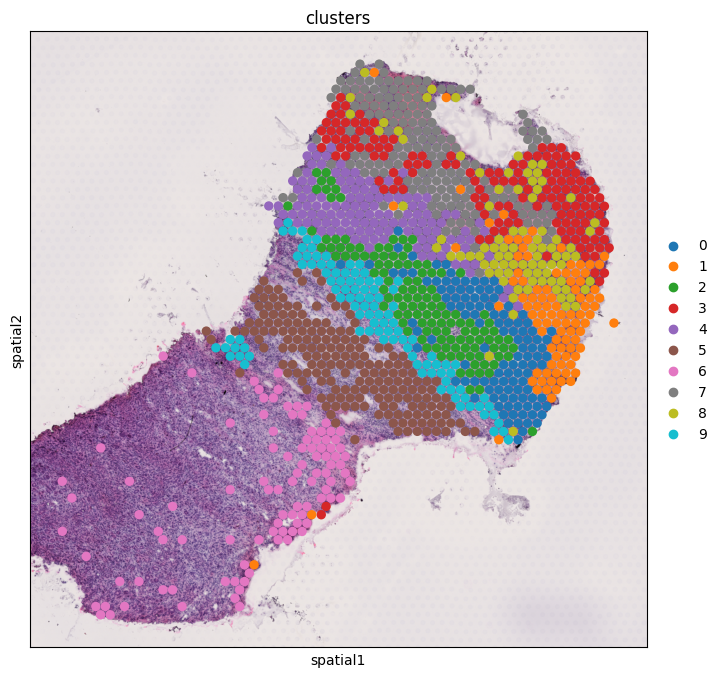

In [83]:
sc.pl.spatial(adata, img_key="hires", library_id = 'spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A',color="clusters", size=1.5)


categories: 0, 1, 2, etc.
var_group_labels: 1, 0


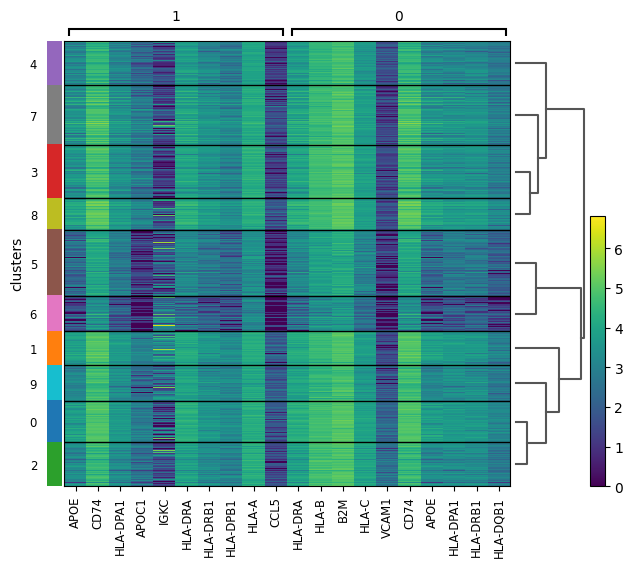

In [84]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="10", n_genes=10, groupby="clusters")

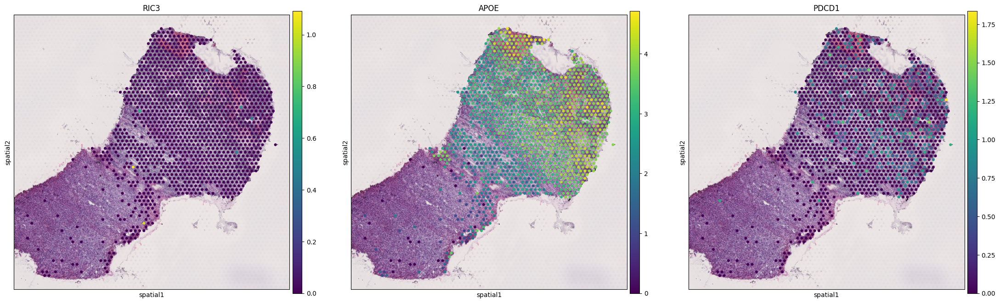

In [90]:
sc.pl.spatial(adata, img_key="hires", library_id = 'spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A',color=["RIC3", "APOE","PDCD1"])

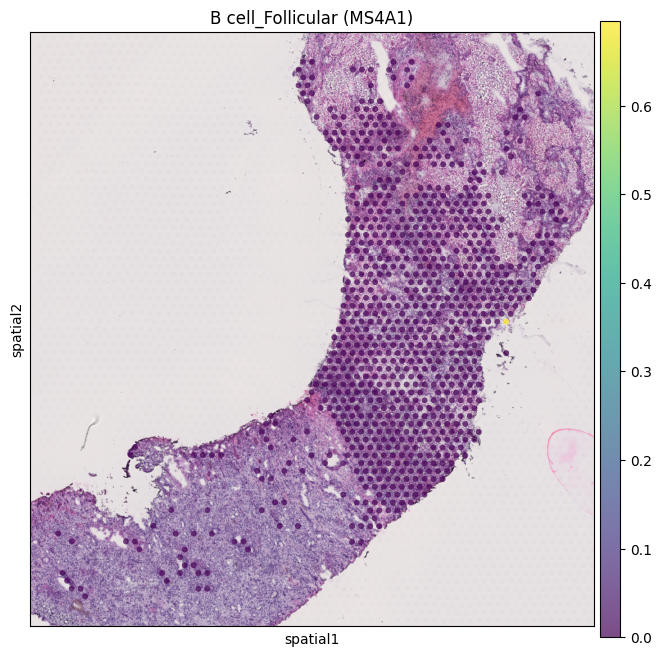

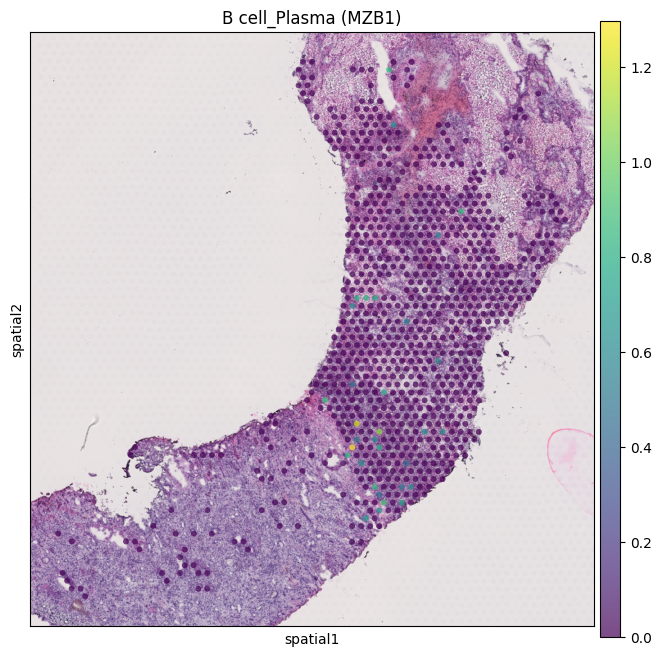

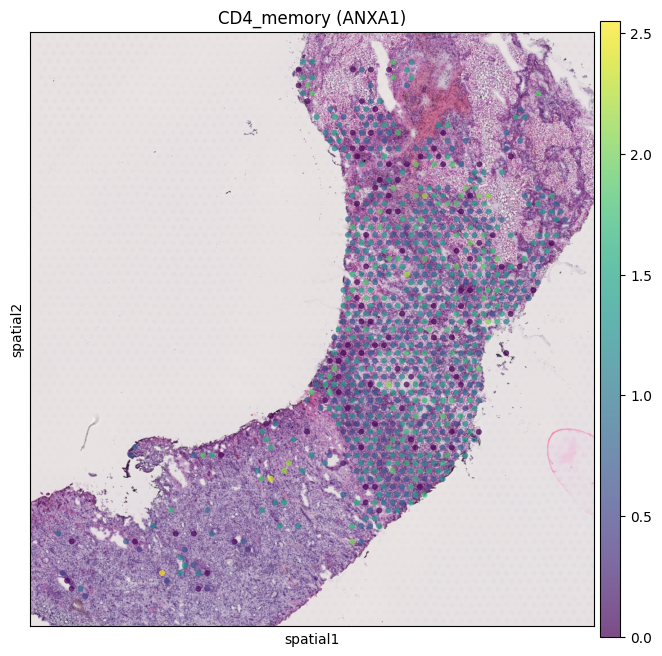

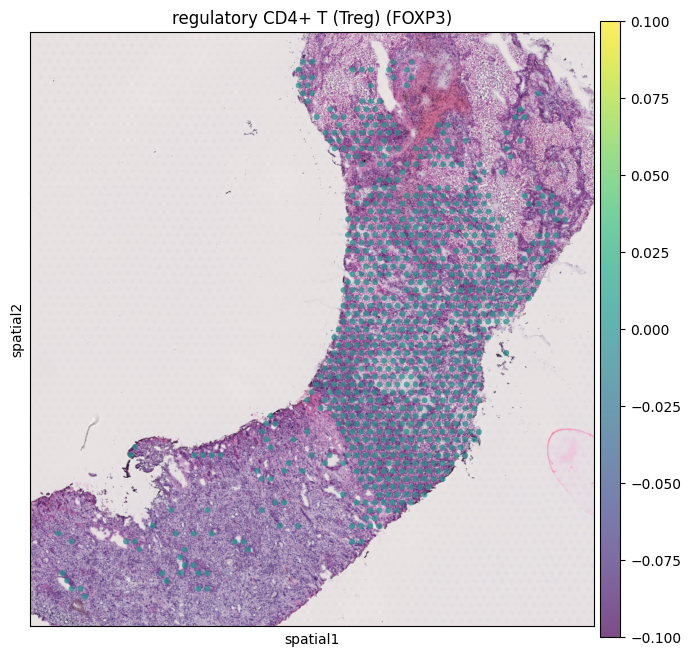

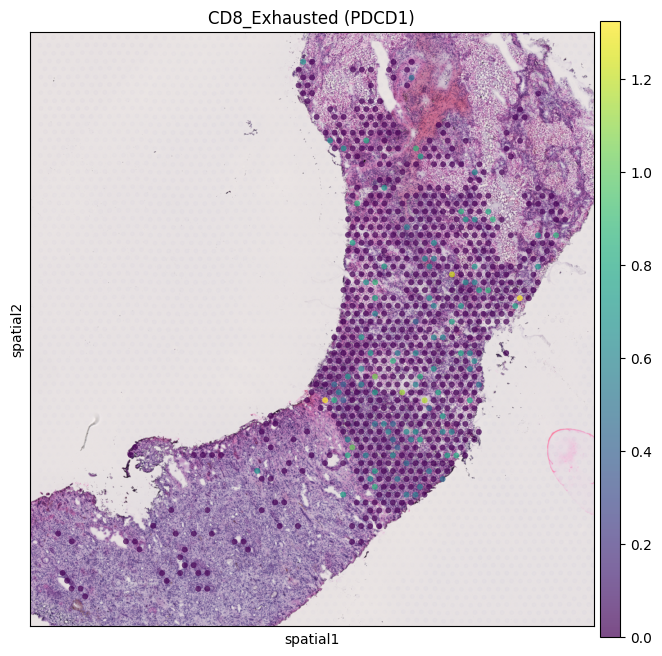

...

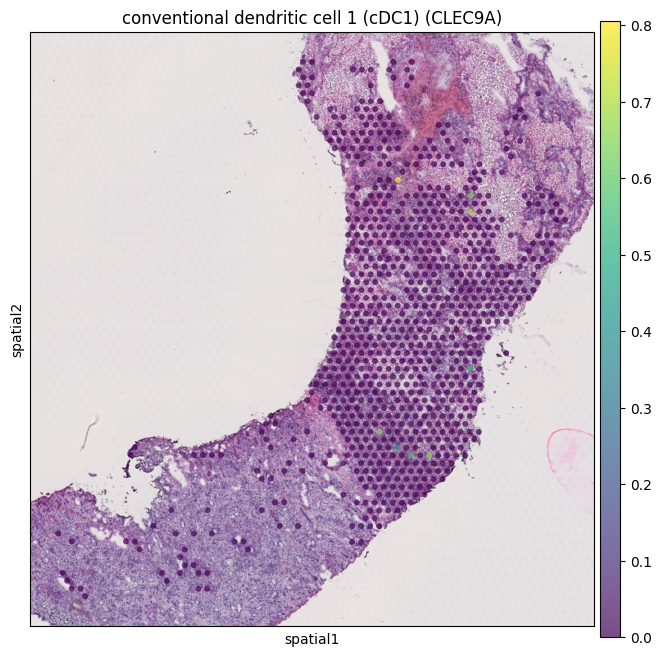

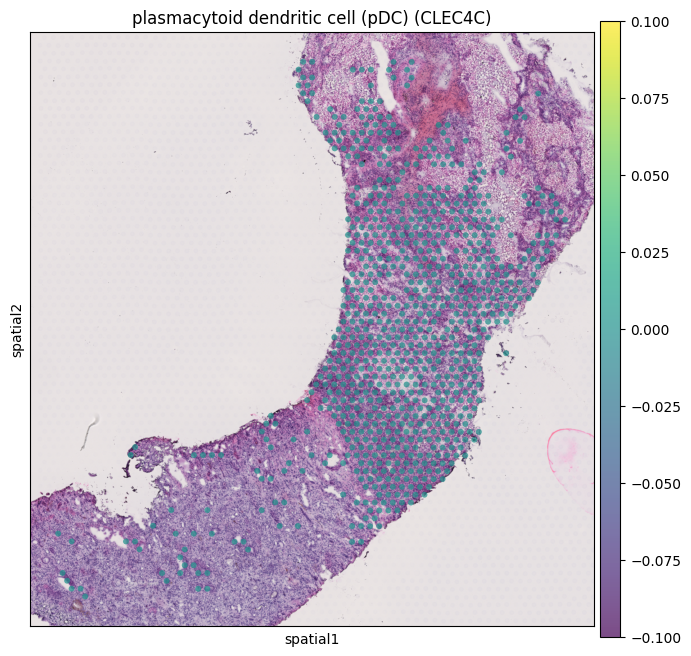

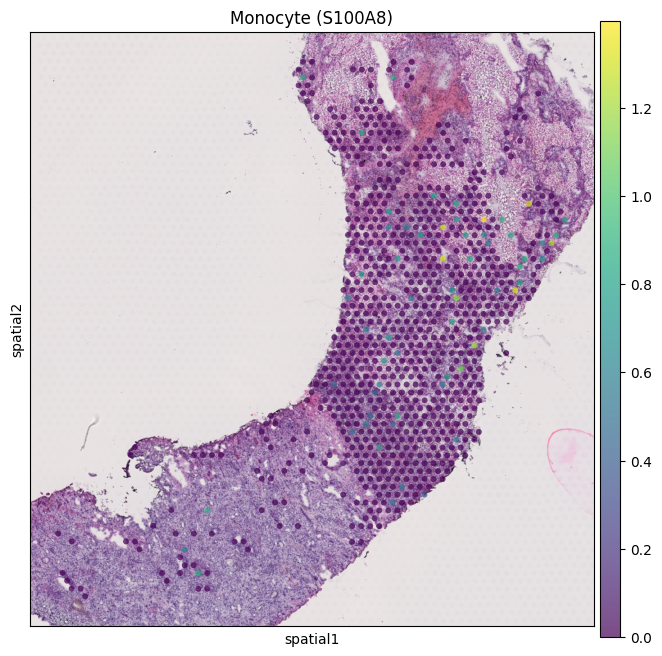

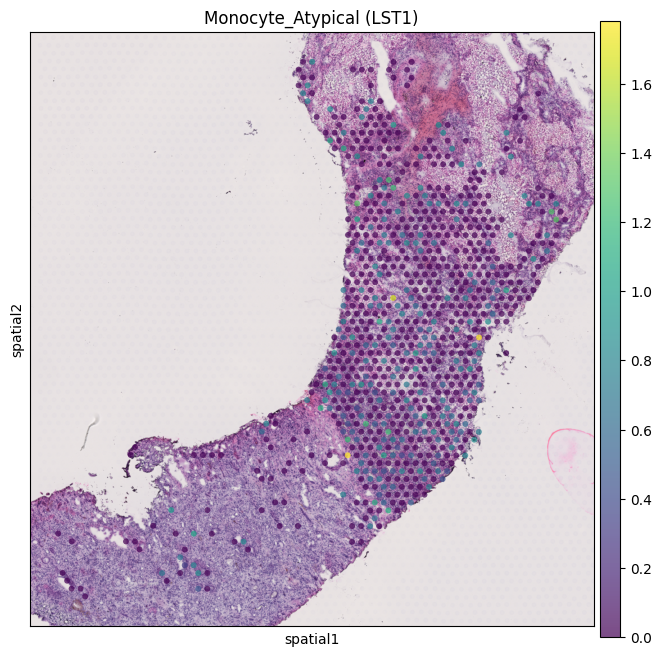

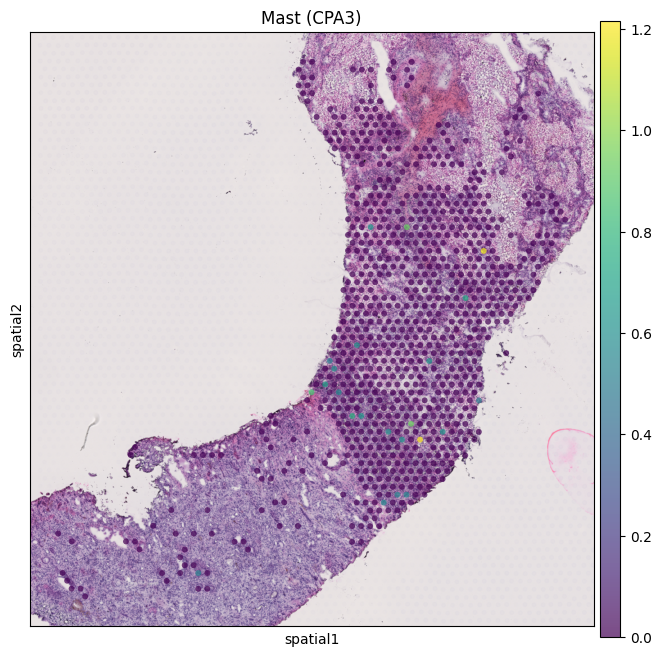

In [75]:
import scanpy as sc

# 클러스터와 유전자를 딕셔너리로 정의
cluster_genes = {
    "B cell_Follicular": "MS4A1",
    "B cell_Plasma": "MZB1",
    "CD4_memory": "ANXA1",
    "regulatory CD4+ T (Treg)": "FOXP3",
    "CD8_Exhausted": "PDCD1",
    "CD8_Proliferative": "MIK67",
    "NK_cytotoxic": "GNLY",
    "NK_surveillance": "XCL1",
    "tumor-associated macrophage (TAM)": "APOE",
    "Macro_Proliferative": "TOP2A",
    "conventional dendritic cell 1 (cDC1)": "CLEC9A",
    "cDC2": "CELC10A",
    "plasmacytoid dendritic cell (pDC)": "CLEC4C",
    "Monocyte": "S100A8",
    "Monocyte_Atypical": "LST1",
    "Mast": "CPA3"
}

# 관심 있는 유전자 목록
genes = list(cluster_genes.values())

# AnnData 객체에서 존재하는 유전자 필터링
existing_genes = [gene for gene in genes if gene in adata.var_names]

# 존재하지 않는 유전자 경고 메시지 출력
missing_genes = set(genes) - set(existing_genes)
if missing_genes:
    print(f"Warning: The following genes are not found in the dataset and will be excluded: {', '.join(missing_genes)}")

# 기존 유전자에 따라 딕셔너리 필터링
existing_gene_names = {cell: gene for cell, gene in cluster_genes.items() if gene in existing_genes}

# Spatial plot 생성
for cell_name, gene in existing_gene_names.items():
    sc.pl.spatial(
        adata,
        img_key="hires",                # 배경 이미지
        library_id='spaceranger130_count_44317_6800STDY12499507_GRCh38-2020-A', # 라이브러리 키 정렬
        color=[gene],                  # 유전자 선택
        alpha=0.7,                     # 점 투명도
        title=f"{cell_name} ({gene})"  # 플롯 제목
    )
